In [1]:
import imp
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# read data.
## tsne_df.csv is a file with tsne coordinates (2 components)
## metadata is a file with only metadata columns for all samples. 

#Both files have the same number of rows and should have a matching order

tsne_res = pd.read_csv('tsne_df.csv')
metadata = pd.read_csv('meta_filt_data_cat.csv')

In [3]:
# join both datasets 
tsne_np = tsne_res.to_numpy()
meta_np = metadata.to_numpy()
join = np.concatenate((meta_np,tsne_np),axis=1)

In [81]:
#I couldn't figure out how to do the filtering using numpy arrays so I turned it into pd.DataFrame
headers = ['Sample', 'Project', 'SampleName', 'PMID', 'Genotype', 'Ecotype','Tissue_raw', 'TotalReads', 'UniqueMappedRate', 'ReleaseDate', 'Count','Tissue', 'VegetativeRepro', 'AboveBelow', 'x_axis', 'y_axis']
join_df = pd.DataFrame(join,columns = headers)

# Separate the df into samples with no category assigned to tissue (other) and samples with an assigned category (noOther)
other = join_df.loc[join_df["Tissue"] == 'other'] 
noOther = join_df.loc[join_df["Tissue"] != 'other']

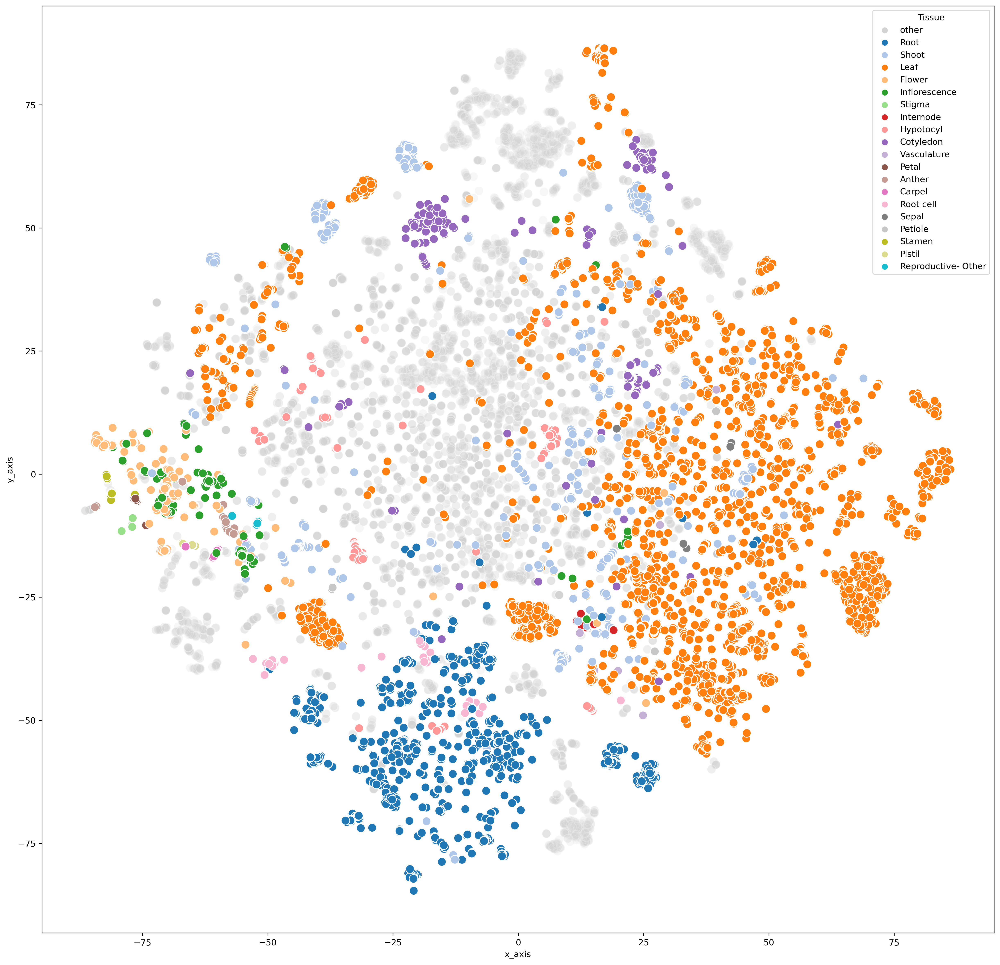

In [87]:
# Plot for tissue type (gray points correspond to other tissues)

plt.figure(figsize = (20,20),dpi=300)
plot = sns.scatterplot(data = other, x="x_axis",y="y_axis",palette= ["lightgray"], hue="Tissue", s = 100, alpha = 0.2);
sns.scatterplot(data = noOther, x="x_axis",y="y_axis",hue = "Tissue", s = 100, alpha = 1, palette = "tab20")
plt.savefig('Tissue_allsamples_other.png')


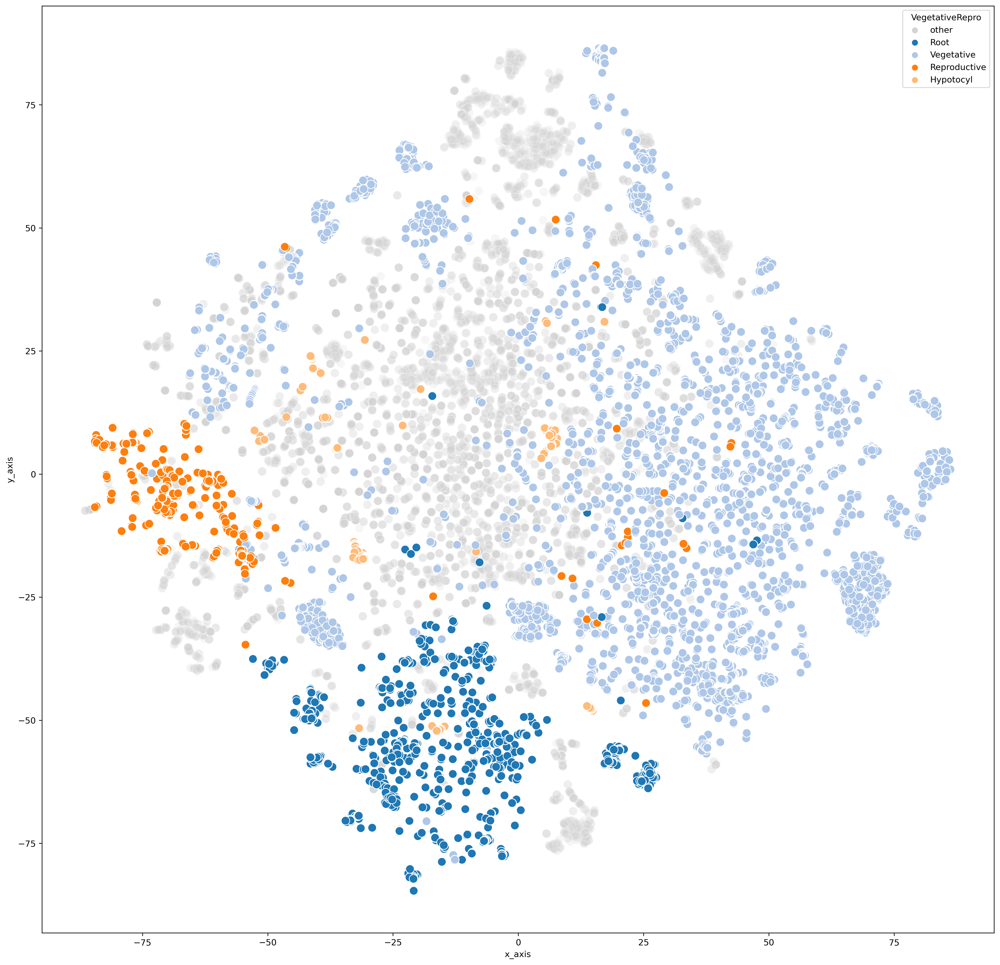

In [88]:
# Plot for vegetative or reproductive

plt.figure(figsize = (20,20),dpi=300)
plot = sns.scatterplot(data = other, x="x_axis",y="y_axis",palette= ["lightgray"], hue="VegetativeRepro", s = 100, alpha = 0.2);
sns.scatterplot(data = noOther, x="x_axis",y="y_axis",hue = "VegetativeRepro", s = 100, alpha = 1, palette = "tab20")
plt.savefig('VegReg_allsamples_other.png')

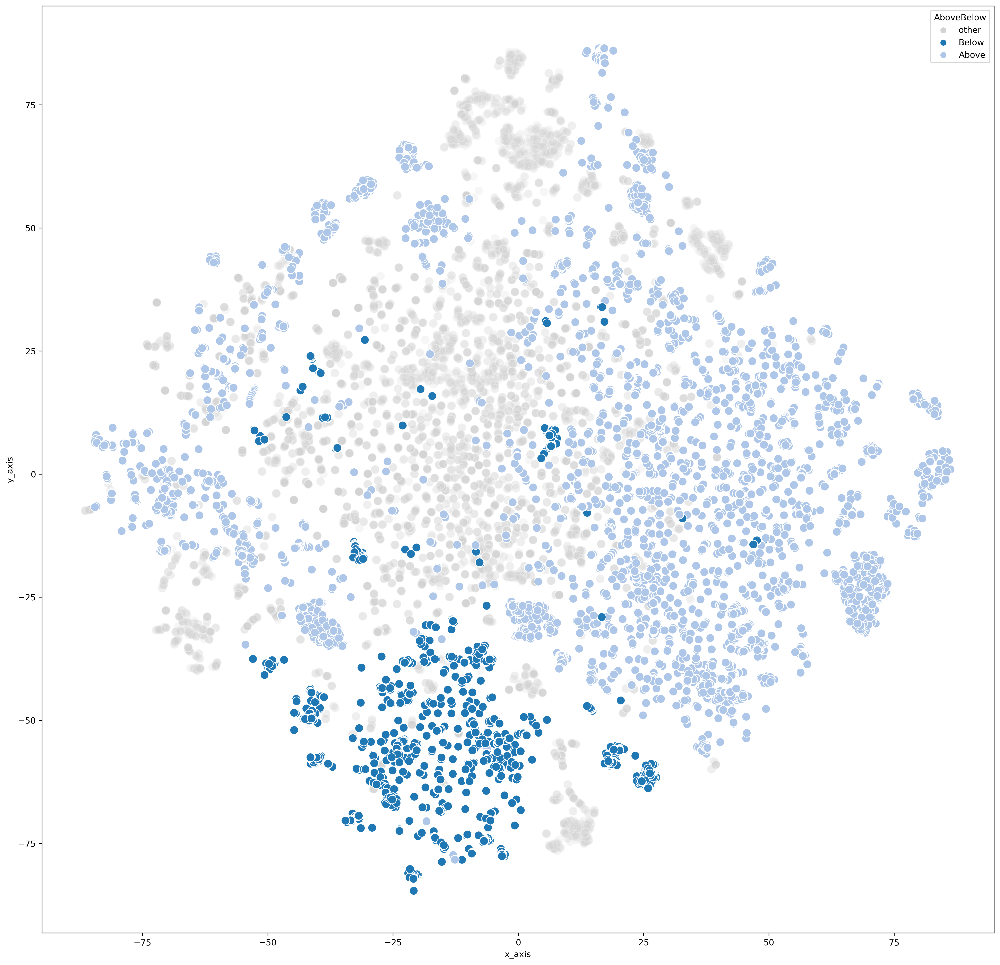

In [89]:
# Plot for above or below 

plt.figure(figsize = (20,20),dpi=300)
plot = sns.scatterplot(data = other, x="x_axis",y="y_axis",palette= ["lightgray"], hue="AboveBelow", s = 100, alpha = 0.2);
sns.scatterplot(data = noOther, x="x_axis",y="y_axis",hue = "AboveBelow", s = 100, alpha = 1, palette = "tab20")
plt.savefig('AboveBelow_allsamples_other.png')